Shape (21613, 21)

No missing values 

All unique

In [2]:
import pandas as pd 
import seaborn as sns

pd.set_option("display.max_columns", None)
data = pd.read_csv("../data/raw/king_ country_ houses_aa.csv")
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [3]:
data.shape

(21613, 21)

```
id :- It is the unique numeric number assigned to each house being sold.
date :- It is the date on which the house was sold out.
price:- It is the price of house which we have to predict so this is our target variable and aprat from it are our features.
bedrooms :- It determines number of bedrooms in a house.
bathrooms :- It determines number of bathrooms in a bedroom of a house.
sqft_living :- It is the measurement variable which determines the measurement of house in square foot.
sqft_lot : It is also the measurement variable which determines square foot of the lot.
floors: It determines total floors means levels of house.
waterfront : This feature determines whether a house has a view to waterfront 0 means no 1 means yes.
view : This feature determines whether a house has been viewed or not 0 means no 1 means yes.
condition : It determines the overall condition of a house on a scale of 1 to 5.
grade : It determines the overall grade given to the housing unit, based on King County grading system on a scale of 1 to 11
sqft_above : It determines square footage of house apart from basement.
sqft_basement : It determines square footage of the basement of the house.
yr_built : It detrmines the date of building of the house.
yr_renovated : It detrmines year of renovation of house.
zipcode : It determines the zipcode of the location of the house.
lat : It determines the latitude of the location of the house.
long : It determines the longitude of the location of the house.
sqft_living15 : Living room area in 2015(implies-- some renovations)
sqft_lot15 : lotSize area in 2015(implies-- some renovations)
```

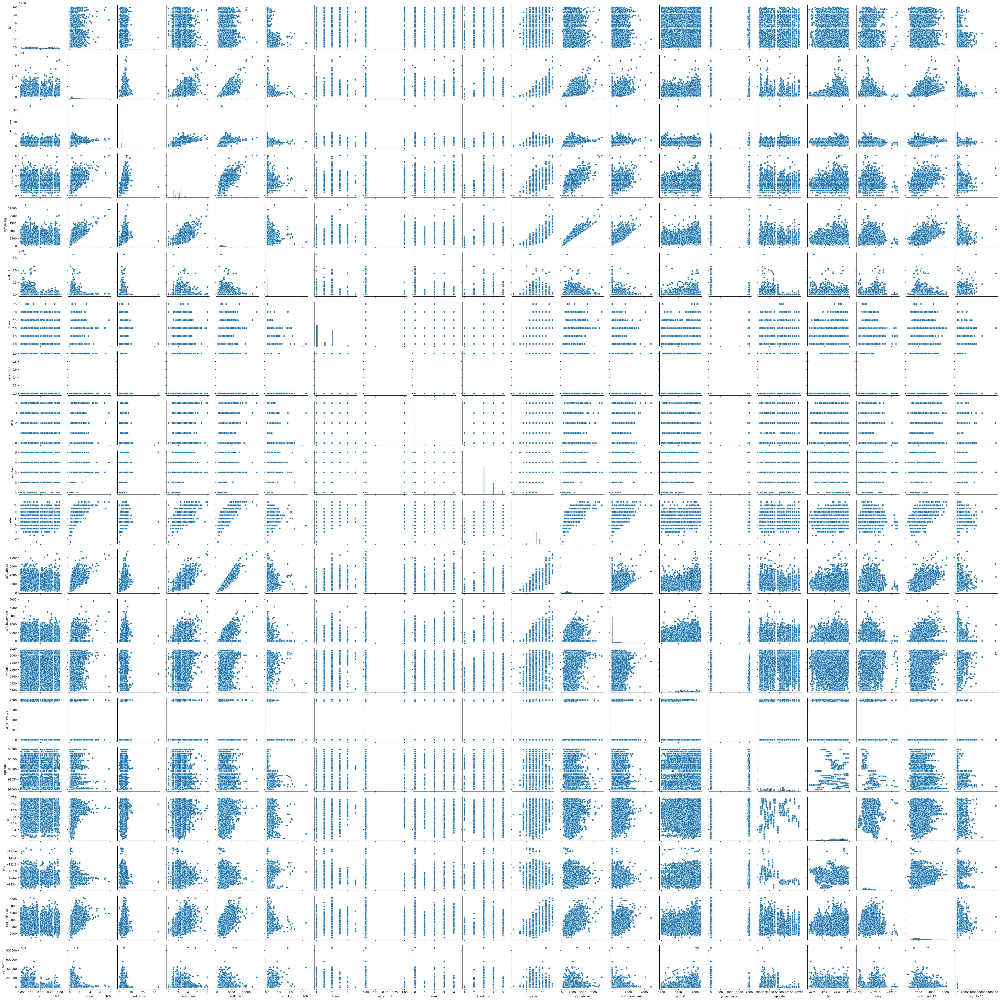

In [4]:
sns.pairplot(data)

In [5]:
data.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [6]:
data.nunique()

id               21436
date               372
price             4028
bedrooms            13
bathrooms           30
sqft_living       1038
sqft_lot          9782
floors               6
waterfront           2
view                 5
condition            5
grade               12
sqft_above         946
sqft_basement      306
yr_built           116
yr_renovated        70
zipcode             70
lat               5034
long               752
sqft_living15      777
sqft_lot15        8689
dtype: int64

- Some weird features 
```
floors               6
waterfront           2
view                 5
condition            5
grade               12
```
- Categorical features
    - zipcode 

In [ ]:
len(data[data.view == 0]) / len(data) # 90% of data have view == 0

0.9017258131680007

In [ ]:
len(data[data.waterfront == 1]) / len(data) # 0.75% of data have waterfront == 1

0.007541757275713691

In [7]:
data.info()

<class 'pandas.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  str    
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long           21

- No null values


In [8]:
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


Quite a few outliers everywhere

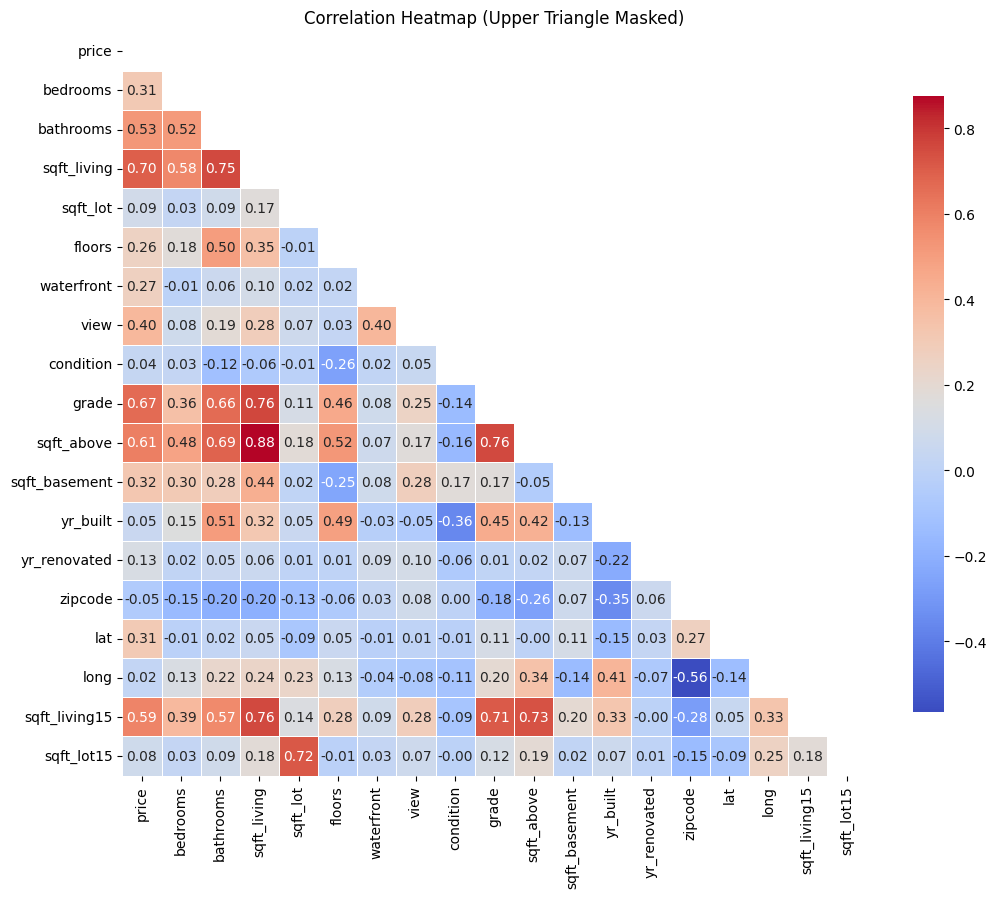

In [9]:
import numpy as np
import matplotlib.pyplot as plt

corr = data.drop(["id", "date"], axis=1).corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(12, 10))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap="coolwarm", square=True,
            linewidths=.5, cbar_kws={"shrink": .8})
plt.title("Correlation Heatmap (Upper Triangle Masked)")
plt.show()

- feature id doesnt give any signal
- feature date probably doesn't give any signal


- sqft_living15 sometimes have different value from sqft_living. However the yr_renovated at the same time sometimes is 0

- With the price correlated the most sqft_living, grade, sqft_above, sqft_living15

In [10]:
import plotly.graph_objects as go
import plotly.express as px

log_data = data.copy()
log_data["log_price"] = np.log(data.price)
log_data["sqft_above"] = np.log(data.sqft_above)
log_data["sqft_basement"] = np.log1p(data.sqft_basement)
log_data["sqft_living"] = np.log(data.sqft_living)
log_data["sqft_lot"] = np.log(data.sqft_lot)
log_data["sqft_living15"] = np.log(data.sqft_living15)
log_data["sqft_lot15"] = np.log(data.sqft_lot15)

features_to_show = ["log_price", "grade", "condition", "view", "waterfront", "yr_built", "sqft_living"]

fig = go.Figure()

for i, feat in enumerate(features_to_show):
    values = log_data[feat]
    fig.add_trace(go.Scattermap(
        lat=log_data["lat"],
        lon=log_data["long"],
        mode="markers",
        marker=dict(
            size=6,
            opacity=0.6,
            color=values,
            colorscale="Viridis",
            colorbar=dict(title=feat),
            showscale=True,
        ),
        hovertemplate=f"<b>{feat}</b>: %{{marker.color:.2f}}<extra></extra>",
        name=feat,
        visible=(i == 0),
    ))

buttons = [
    dict(
        label=feat,
        method="update",
        args=[{"visible": [j == i for j in range(len(features_to_show))]}],
    )
    for i, feat in enumerate(features_to_show)
]

fig.update_layout(
    map=dict(style="carto-positron", zoom=10, center=dict(lat=47.56, lon=-122.21)),
    margin=dict(l=0, r=0, t=40, b=0),
    height=600,
    title="King County House Sales",
    showlegend=False,
    updatemenus=[dict(
        buttons=buttons,
        direction="down",
        x=0.01,
        xanchor="left",
        y=0.99,
        yanchor="top",
        showactive=True,
    )],
)
fig.show()

[Text(0.5, 1.0, 'Price')]

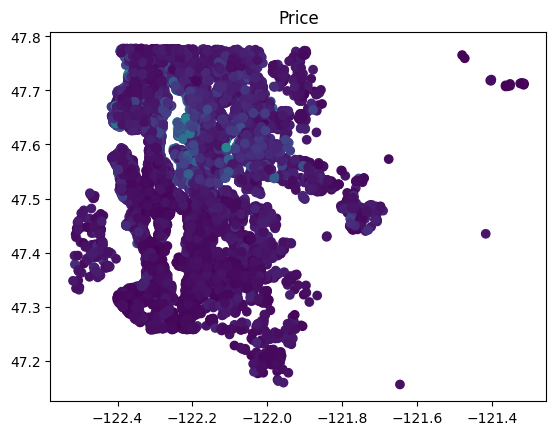

In [11]:
fig, ax = plt.subplots(1, 1)
ax.scatter(data.long, data.lat, c=log_data.price)
ax.set(title="Price")

[Text(0.5, 1.0, 'Zipcode')]

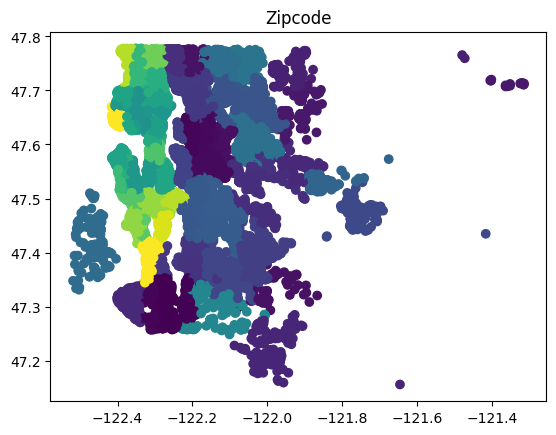

In [12]:
fig, ax = plt.subplots(1, 1)
ax.scatter(data.long, data.lat, c=data.zipcode)
ax.set(title="Zipcode")

Let's see price by zipcode

[Text(0.5, 1.0, 'Average Price per zipcode')]

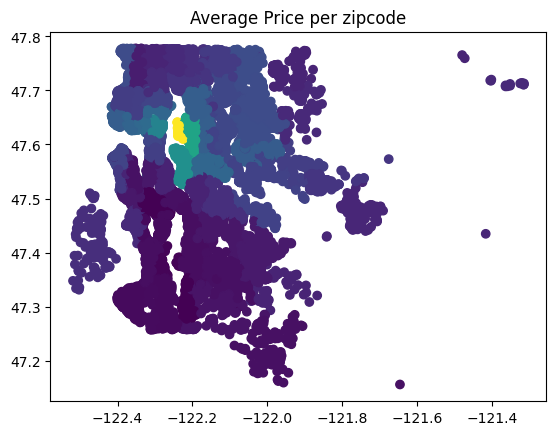

In [13]:
zipcode_mean_price = log_data.groupby("zipcode")["price"].mean()
d = pd.merge(log_data, zipcode_mean_price, on="zipcode")

fig, ax = plt.subplots(1, 1)
ax.scatter(d.long, d.lat, c=d.price_y)
ax.set(title="Average Price per zipcode")

[Text(0.5, 1.0, 'View')]

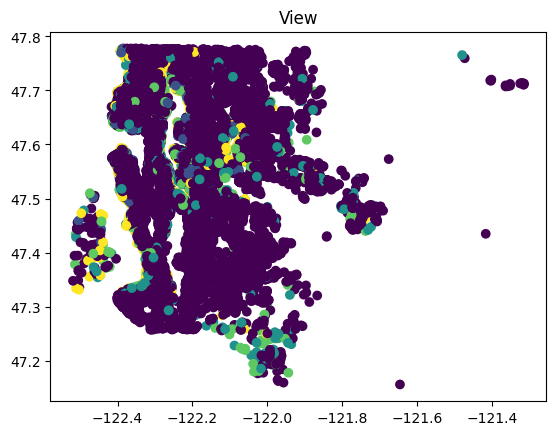

In [14]:
fig, ax = plt.subplots(1, 1)
ax.scatter(data.long, data.lat, c=data.view)
ax.set(title="View")

[Text(0.5, 1.0, 'Waterfrong')]

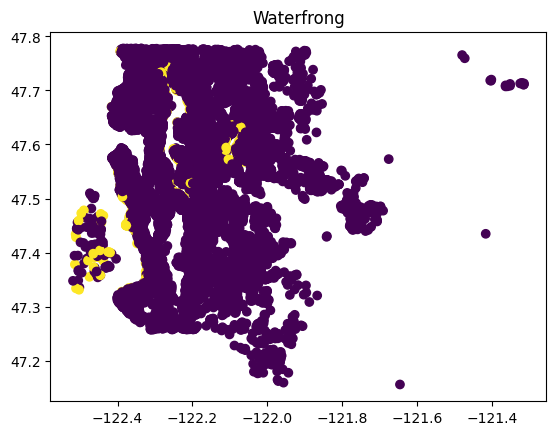

In [ ]:
fig, ax = plt.subplots(1, 1)
ax.scatter(data.long, data.lat, c=data.waterfront)
ax.set(title="Waterfront")

[Text(0.5, 1.0, 'Grade')]

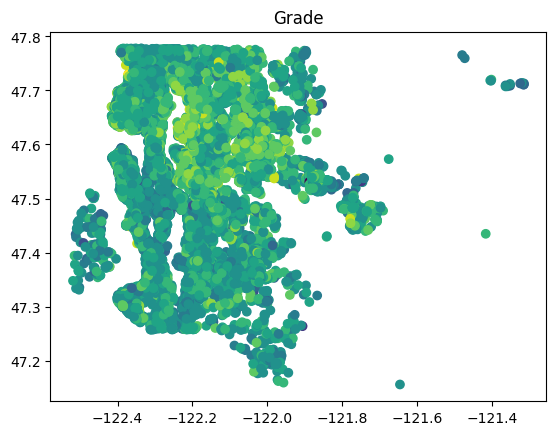

In [16]:
fig, ax = plt.subplots(1, 1)
ax.scatter(data.long, data.lat, c=data.grade)
ax.set(title="Grade")

price feature is very right skewed

bedroom -- normal, categorical?

bathroom -- weird 

sqft_living -- "normal" a bit right skewed

sqft_lot -- WTF is this distribution???

floors - a bit weird. Categorical?? What the hell is 1.5 floors

waterfront - categorical, unbalanced. VERY UNBALANCED

view - categorical

condition - 

grade - kinda normal

sqft_above -- "normal" right skewed

sqft_basement -- high spike where there is no basement

yr_build -- almost uniform

yr_renovated -- high spike on 0 where there is no renovation

zipcode - categorical, 

lat 

long 

sqft_living15 - "normal" very close to normal, right skewed. No 0 values. Frequently different value from the sqft_living, which means renovations were made, but there is no record of such TODO

sqft_lot15 -- high spike near 0

## Very right skewed features

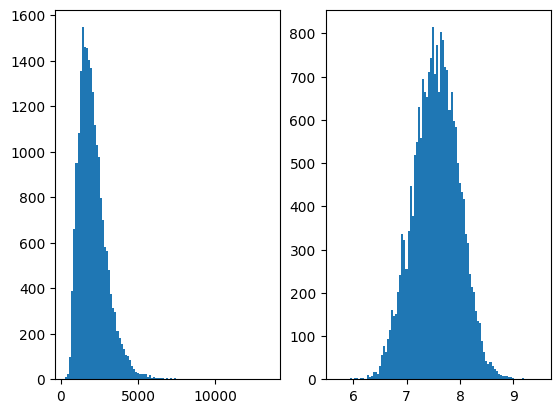

In [17]:
fig, ax = plt.subplots(1, 2)

_ = ax[0].hist(data.sqft_living, bins=100)

_ = ax[1].hist(np.log(data.sqft_living), bins = 100)

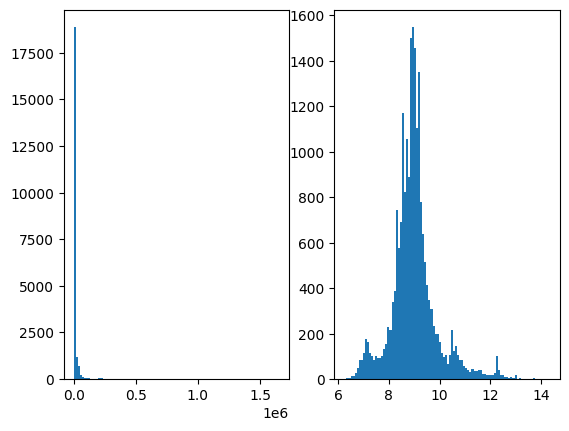

In [18]:
fig, ax = plt.subplots(1, 2)

_ = ax[0].hist(data.sqft_lot, bins=100)

_ = ax[1].hist(np.log(data.sqft_lot), bins = 100)

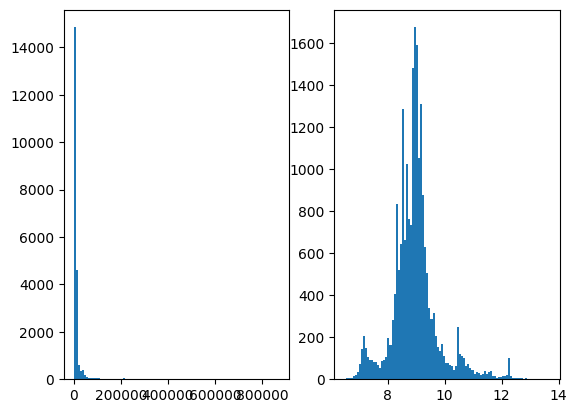

In [19]:
fig, ax = plt.subplots(1, 2)

# Assigning to mute the output
_ = ax[0].hist(data.sqft_lot15, bins=100)

_ = ax[1].hist(np.log(data.sqft_lot15), bins = 100)

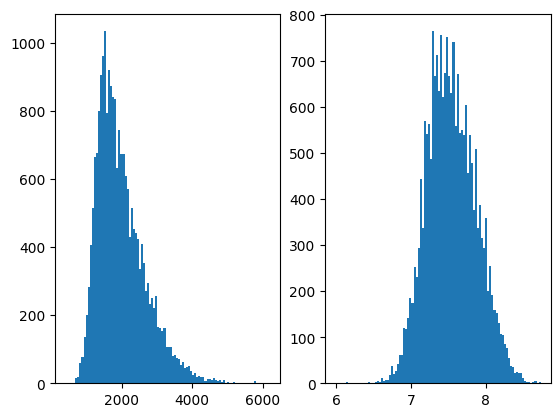

In [20]:
fig, ax = plt.subplots(1, 2)

# Assigning to mute the output
_ = ax[0].hist(data.sqft_living15, bins=100)

_ = ax[1].hist(np.log(data.sqft_living15), bins = 100)

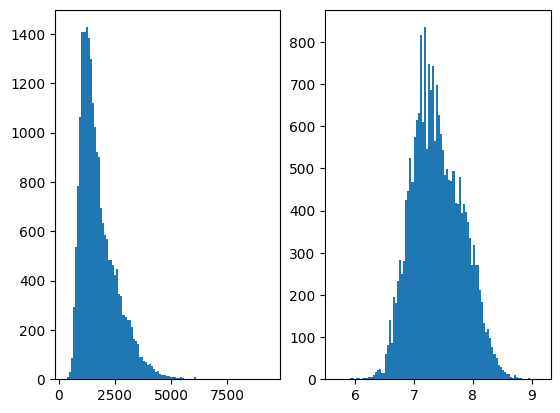

In [21]:
fig, ax = plt.subplots(1, 2)

# Assigning to mute the output
_ = ax[0].hist(data.sqft_above, bins=100)

_ = ax[1].hist(np.log(data.sqft_above), bins = 100)

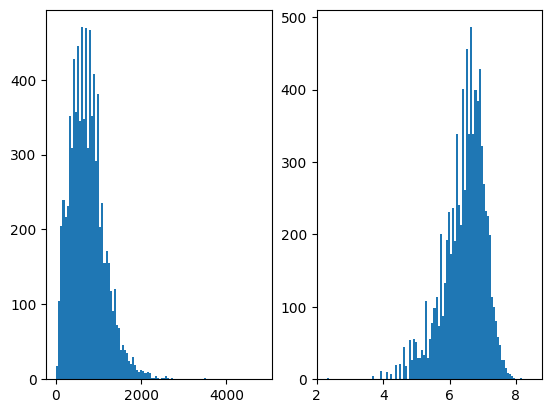

In [22]:
fig, ax = plt.subplots(1, 2)

# sqft_basement without 0
# Assigning to mute the output
_ = ax[0].hist(data[data.sqft_basement > 0].sqft_basement, bins=100)

_ = ax[1].hist(np.log(data[data.sqft_basement > 0].sqft_basement), bins = 100)

In [23]:
data.view.value_counts()

view
0    19489
2      963
3      510
1      332
4      319
Name: count, dtype: int64

In [24]:
data.date = pd.to_datetime(data.date)

In [25]:
data.shape

(21613, 21)

## Outliers

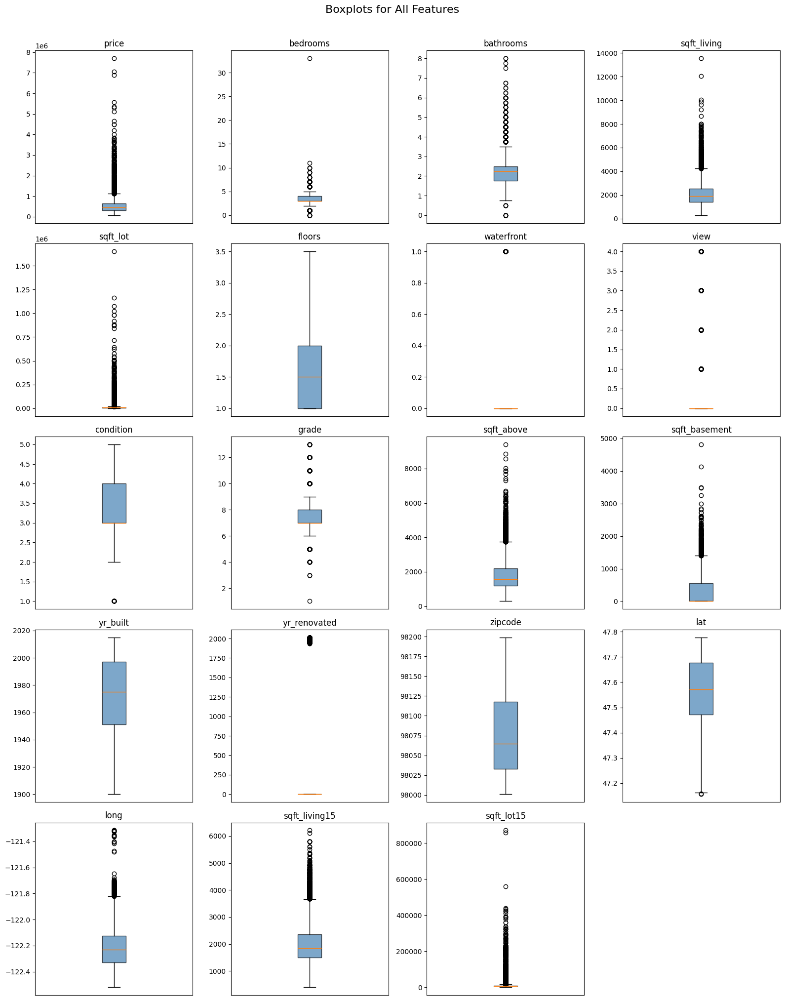

In [26]:
features = data.drop(columns=["id", "date"])
n = len(features.columns)
ncols = 4
nrows = -(-n // ncols)  # ceiling division

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
axes = axes.flatten()

for i, col in enumerate(features.columns):
    axes[i].boxplot(features[col].dropna(), vert=True, patch_artist=True,
                    boxprops=dict(facecolor="steelblue", alpha=0.7))
    axes[i].set_title(col)
    axes[i].set_xticks([])

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("Boxplots for All Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

33 bedroom is an 100% outlier

I don't see any other so obvious outliers. Except maybee the two entries on the sqft_lot15. If all the values, except for the sqft_lot15 for this points are more normal, then it is an entry error 

In [27]:
data.sqft_lot15.sort_values(ascending=False).head(3)

9714     871200
20452    858132
13464    560617
Name: sqft_lot15, dtype: int64

In [28]:
outlier = data.iloc[9714]
outlier

id                         225079036
date             2015-01-07 00:00:00
price                       937500.0
bedrooms                           4
bathrooms                        4.0
sqft_living                     5545
sqft_lot                      871200
floors                           2.0
waterfront                         0
view                               0
condition                          3
grade                             11
sqft_above                      3605
sqft_basement                   1940
yr_built                        2003
yr_renovated                       0
zipcode                        98014
lat                           47.676
long                        -121.882
sqft_living15                   3420
sqft_lot15                    871200
Name: 9714, dtype: object

Let's check the Z-Score for all the other features for the potential outliers 

In [29]:
from scipy.stats import zscore

def check_if_outlier(outlier_id):
    print("=" * 50)
    print(f"ID: {outlier_id}")
    print(f"Price z-score: {zscore(data.price)[outlier_id]}")
    print(f"sqft_living z-score: {zscore(data.sqft_living)[outlier_id]}")
    print(f"sqft_lot z-score: {zscore(data.sqft_lot)[outlier_id]}")
    print(f"sqft_lot15 z-score: {zscore(data.sqft_lot15)[outlier_id]}")
    print()

Looks like it is an outlier, not an input error
- The Price z-score < 2 -- Not outlier for the price 
- The sqft_living > 3 -- Outlier
- The sqft_lot > 20 -- WTF! Outlier
- The sqft_living15 > 31 -- DEAD Outlier

In [30]:
check_if_outlier(9714)
check_if_outlier(20452)
check_if_outlier(13464)

ID: 9714
Price z-score: 1.0825159676954192
sqft_living z-score: 3.7728943038821985
sqft_lot z-score: 20.66881375565044
sqft_lot15 z-score: 31.44029287005133

ID: 20452
Price z-score: 2.887109398264106
sqft_living z-score: 4.845388779214749
sqft_lot z-score: 20.66881375565044
sqft_lot15 z-score: 30.961673753674678

ID: 13464
Price z-score: 0.6807385623989947
sqft_living z-score: 0.6098522218100552
sqft_lot z-score: 10.065995393284764
sqft_lot15 z-score: 20.065104545777597



In [31]:
data.describe()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,2014-10-29 04:38:01.959931,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
min,1.000102e+06,2014-05-02 00:00:00,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,2014-07-22 00:00:00,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,2014-10-16 00:00:00,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,2015-02-17 00:00:00,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,2015-05-27 00:00:00,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000
std,2.876566e+09,NaN,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631


In [32]:
data[data.bedrooms == 0]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
875,6306400140,2014-06-12,1095000.0,0,0.00,3064,4764,3.5,0,2,3,7,3064,0,1990,0,98102,47.6362,-122.322,2360,4000
3119,3918400017,2015-02-05,380000.0,0,0.00,1470,979,3.0,0,2,3,8,1470,0,2006,0,98133,47.7145,-122.356,1470,1399
3467,1453602309,2014-08-05,288000.0,0,1.50,1430,1650,3.0,0,0,3,7,1430,0,1999,0,98125,47.7222,-122.290,1430,1650
4868,6896300380,2014-10-02,228000.0,0,1.00,390,5900,1.0,0,0,2,4,390,0,1953,0,98118,47.5260,-122.261,2170,6000
6994,2954400190,2014-06-24,1295650.0,0,0.00,4810,28008,2.0,0,0,3,12,4810,0,1990,0,98053,47.6642,-122.069,4740,35061
8477,2569500210,2014-11-17,339950.0,0,2.50,2290,8319,2.0,0,0,3,8,2290,0,1985,0,98042,47.3473,-122.151,2500,8751
8484,2310060040,2014-09-25,240000.0,0,2.50,1810,5669,2.0,0,0,3,7,1810,0,2003,0,98038,47.3493,-122.053,1810,5685
9773,3374500520,2015-04-29,355000.0,0,0.00,2460,8049,2.0,0,0,3,8,2460,0,1990,0,98031,47.4095,-122.168,2520,8050
9854,7849202190,2014-12-23,235000.0,0,0.00,1470,4800,2.0,0,0,3,7,1470,0,1996,0,98065,47.5265,-121.828,1060,7200
12653,7849202299,2015-02-18,320000.0,0,2.50,1490,7111,2.0,0,0,3,7,1490,0,1999,0,98065,47.5261,-121.826,1500,4675


In [33]:
remove_candidates = ["id", "date"]
cleaned_data = data[data.bedrooms < 30].drop(remove_candidates, axis = 1)

What are 0 bathrooms and 0 bedrooms lots. Can they be the empty lots without a house for sale? The same time min floor is 1... 

Let's see the most extreme cases of z-Score for all data 

In [34]:
scores = zscore(cleaned_data)
scores

array([[-0.86668617, -0.40692359, -1.44745951, ..., -0.30611525,
        -0.94339773, -0.26072358],
       [-0.00567521, -0.40692359,  0.17558163, ..., -0.74637458,
        -0.43272969, -0.18787744],
       [-0.98081575, -1.50829275, -1.44745951, ..., -0.13569228,
         1.07009338, -0.17238527],
       ...,
       [-0.37584455, -1.50829275, -1.77206774, ..., -0.60435544,
        -1.41029422, -0.39414664],
       [-0.38156737, -0.40692359,  0.50018986, ...,  1.02886466,
        -0.84126412, -0.42051628],
       [-0.58585659, -1.50829275, -1.77206774, ..., -0.60435544,
        -1.41029422, -0.41795257]], shape=(21612, 19))

In [35]:
sum(scores > 2) / len(scores) # Percent of outliers per column

array([0.03900611, 0.01540811, 0.02577272, 0.04076439, 0.0220248 ,
       0.02873404, 0.00754211, 0.0829169 , 0.07866   , 0.02322784,
       0.04525264, 0.0519156 , 0.        , 0.04229132, 0.03391634,
       0.        , 0.03516565, 0.0456228 , 0.02285767])

In [36]:
sum((scores > 2).any(axis = 1)) / len(scores) # Percent of outliers total. Many of the outliers are outliers in every feature

np.float64(0.35767166389043126)

Maybe if we take z-score > 3

In [37]:
sum(scores > 3) / len(scores) # Percent of outliers per column

array([0.01878586, 0.00282251, 0.0086526 , 0.01147511, 0.01605589,
       0.00037016, 0.00754211, 0.03835832, 0.        , 0.00476587,
       0.01175273, 0.01142884, 0.        , 0.04229132, 0.        ,
       0.        , 0.01078105, 0.01096613, 0.01679622])

In [38]:
sum((scores > 3).any(axis = 1)) / len(scores) # Percent of outliers total. Many of the outliers are outliers in every feature

np.float64(0.13173237090505274)

## Target Analysis

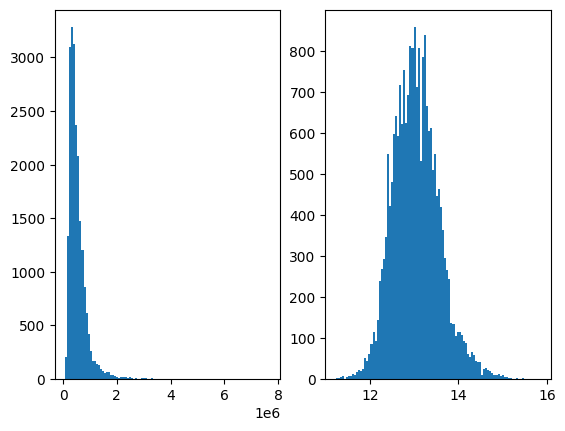

In [39]:
fig, ax = plt.subplots(1, 2)

# Assigning to mute the output

_ = ax[0].hist(data.price, bins=100)

_ = ax[1].hist(np.log(data.price), bins = 100)

<Axes: >

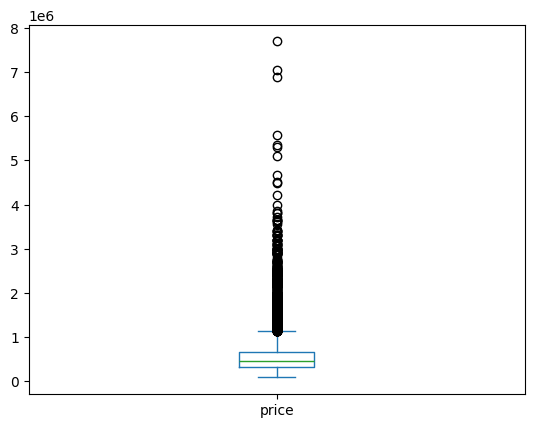

In [40]:
data.price.plot(kind="box")

- The price - target is heavily right skewed
- With the price correlated the most sqft_living, grade, sqft_above, sqft_living15